<a href="https://colab.research.google.com/github/manojgali/languageTranslator/blob/main/teltoeng.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Collection

In [ ]:
import string
import re
from pickle import dump
from unicodedata import normalize
from numpy import array

from pickle import load
from numpy import array
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.utils.vis_utils import plot_model
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Embedding
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.callbacks import ModelCheckpoint
from numpy import argmax

from nltk.translate.bleu_score import corpus_bleu

from urllib import request
from bs4 import BeautifulSoup
import numpy as np

In [ ]:
def data_soup(link):
    url=link
    html = request.urlopen(url).read().decode('utf8')
    raw = BeautifulSoup(html, 'html.parser').get_text()
    lines = raw.strip().split('\n')
    data=[line.split('\t') for line in lines]
    return data

data=data_soup("https://raw.githubusercontent.com/jbrownlee/Datasets/master/deu.txt")

In [ ]:
data=array(data)
eng=data[:,0]
print(len(eng))

152820


In [ ]:
unique_eng = np.unique(eng, axis=0)
print(len(unique_eng))

120418


In [ ]:
X_values=unique_eng[10000:20000]
print(len(X_values))

10000


In [ ]:
with open('listfile1.txt', 'w') as filehandle:
    for listitem in X_values:
        filehandle.write('%s\n' % listitem)


In [ ]:
from google.colab import files
files.download('listfile1.txt') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.upload()

Saving listfile.txt to listfile.txt
Saving TelLang.txt to TelLang.txt


{'TelLang.txt': b'"\xe0\xb0\xa8\xe0\xb1\x82\xe0\xb0\xa4\xe0\xb0\xa8 \xe0\xb0\xb8\xe0\xb0\x82\xe0\xb0\xb5\xe0\xb0\xa4\xe0\xb1\x8d\xe0\xb0\xb8\xe0\xb0\xb0 \xe0\xb0\xb6\xe0\xb1\x81\xe0\xb0\xad\xe0\xb0\xbe\xe0\xb0\x95\xe0\xb0\xbe\xe0\xb0\x82\xe0\xb0\x95\xe0\xb1\x8d\xe0\xb0\xb7\xe0\xb0\xb2\xe0\xb1\x81!" "\xe0\xb0\xa8\xe0\xb1\x87\xe0\xb0\xa8\xe0\xb1\x81 \xe0\xb0\xae\xe0\xb1\x80\xe0\xb0\x95\xe0\xb1\x81 \xe0\xb0\x85\xe0\xb0\xa6\xe0\xb1\x87 \xe0\xb0\x95\xe0\xb1\x8b\xe0\xb0\xb0\xe0\xb1\x81\xe0\xb0\x95\xe0\xb1\x81\xe0\xb0\x82\xe0\xb0\x9f\xe0\xb1\x81\xe0\xb0\xa8\xe0\xb1\x8d\xe0\xb0\xa8\xe0\xb0\xbe\xe0\xb0\xa8\xe0\xb1\x81!"\r\n"\xe0\xb0\xb0\xe0\xb1\x8b\xe0\xb0\xb2\xe0\xb0\xbf\xe0\xb0\x82\xe0\xb0\x97\xe0\xb1\x8d \xe0\xb0\xb0\xe0\xb0\xbe\xe0\xb0\xaf\xe0\xb0\xbf \xe0\xb0\xa8\xe0\xb0\xbe\xe0\xb0\x9a\xe0\xb1\x81\xe0\xb0\xa8\xe0\xb1\x81 \xe0\xb0\xb8\xe0\xb1\x87\xe0\xb0\x95\xe0\xb0\xb0\xe0\xb0\xbf\xe0\xb0\xb8\xe0\xb1\x8d\xe0\xb0\xa4\xe0\xb1\x81\xe0\xb0\x82\xe0\xb0\xa6\xe0\xb0\xbf" \xe0\xb0\x85\xe0\xb0\xa8

In [ ]:
def load_doc(filename):
	# open the file as read only
	file = open(filename, mode='rt', encoding='utf-8')
	# read all text
	text = file.read()
	# close the file
	file.close()
 
	return text

tel=load_doc('TelLang.txt')
eng=load_doc('listfile.txt')

In [ ]:
def to_lines(doc):
  lines = doc.strip().split('\n')
  text = [line for line in  lines]
  return text

Tel = array(to_lines(tel))
Eng = array(to_lines(eng))

In [ ]:
print(len(Tel))
print(len(Eng))

19996
19996


# Pre Processing

In [ ]:
def clean_lines_eng(lines):
  cleaned = list()
  # prepare regex for char filtering
  re_punc = re.compile('[%s]' % re.escape(string.punctuation))
  re_print = re.compile('[^%s]' % re.escape(string.printable))
  
  for line in lines:
    # normalize unicode characters
    line = normalize('NFD', line).encode('ascii', 'ignore')
    line = line.decode('UTF-8')
    # tokenize on white space
    line = line.split()
    # convert to lowercase
    line = [word.lower() for word in line]
    # remove punctuation from each token
    line = [re_punc.sub('', w) for w in line]
    # remove non-printable chars form each token
    line = [re_print.sub('', w) for w in line]
    # remove tokens with numbers in them
    line = [word for word in line if word.isalpha()]
    # store as string
    cleaned.append(' '.join(line))
  return array(cleaned)

In [ ]:
def clean_lines_tel(lines):
  cleaned = list()
  re_punc = re.compile('[%s]' % re.escape(string.punctuation))
  re_print = re.compile('[^%s]' % re.escape(string.printable))
  
  for line in lines:
    line = line.split()
    line = [re_punc.sub('', w) for w in line]
    cleaned.append(' '.join(line))
  return array(cleaned)

In [ ]:
clean_eng = clean_lines_eng(Eng)
clean_tel = clean_lines_tel(Tel)

In [ ]:
rows, cols = (len(Tel), 1) 
test=[] 
for i in range(rows): 
    col = [] 
    for j in range(cols): 
        col.append(Eng[i]) 
        col.append(Tel[i])
    test.append(col) 

In [ ]:
test[:10]

[['"A Happy New Year!" "I wish you the same!"',
  '"నూతన సంవత్సర శుభాకాంక్షలు!" "నేను మీకు అదే కోరుకుంటున్నాను!"'],
 ['"A rolling stone gathers no moss" is a proverb.',
  '"రోలింగ్ రాయి నాచును సేకరిస్తుంది" అనేది ఒక సామెత.'],
 ['"Ah" is an interjection.', '"ఆహ్" ఒక అంతరాయం.'],
 ['"Are scientists close to cloning a human being?" "Not by a long shot."',
  '"శాస్త్రవేత్తలు మనిషిని క్లోనింగ్ చేయడానికి దగ్గరగా ఉన్నారా?" "లాంగ్ షాట్ ద్వారా కాదు."'],
 ['"Are the drinks free?" "Only for ladies."',
  '"పానీయాలు ఉచితం?" "లేడీస్ కోసం మాత్రమే."'],
 ['"Are these your books?" "No, they\'re not mine."',
  '"ఇవి మీ పుస్తకాలేనా?" "లేదు, అవి నావి కావు."'],
 ['"Are you Swedish?" "No, I\'m Swiss."',
  '"మీరు స్వీడిష్?" "లేదు, నేను స్విస్."'],
 ['"Are you and Tom enemies?" "No. Why would we be?"',
  '"మీరు మరియు టామ్ శత్రువులు ఉన్నారా?" "లేదు. మనం ఎందుకు ఉంటాం?"'],
 ['"Are you angry at me?" "You bet I am!"',
  '"మీరు నాపై కోపంగా ఉన్నారా?" "మీరు నేను పందెం!"'],
 ['"Are you going to Tom\'s party?" "I\'m stil

In [ ]:
import random
random.shuffle(test)
len(test)

19996

In [ ]:
test[:10]

[['Even though Tom has a very demanding job, he always makes time for Mary and the kids.',
  'టామ్కు చాలా డిమాండ్ ఉద్యోగం ఉన్నప్పటికీ, అతను ఎల్లప్పుడూ మేరీ మరియు పిల్లలకు సమయం ఇస్తాడు.'],
 ['Apart from a few minor mistakes, your composition was excellent.',
  'కొన్ని చిన్న తప్పులు కాకుండా, మీ కూర్పు అద్భుతమైనది.'],
 ['All the seats are booked.', 'అన్ని సీట్లు బుక్ చేయబడ్డాయి.'],
 ["Despite repeated warnings, Tom didn't stop doing that.",
  'పదేపదే హెచ్చరికలు ఉన్నప్పటికీ, టామ్ అలా చేయడం ఆపలేదు.'],
 ['He was killed instantly.', 'అతను తక్షణమే చంపబడ్డాడు.'],
 ["He's in a good mood today.", 'అతను ఈ రోజు మంచి మానసిక స్థితిలో ఉన్నాడు.'],
 ['Can someone explain this to me?', 'దీన్ని ఎవరైనా నాకు వివరించగలరా?'],
 ['He resolved to do better work in the future.',
  'భవిష్యత్తులో మెరుగైన పని చేయాలని ఆయన సంకల్పించారు.'],
 ['Flying kites can be dangerous.', 'గాలిపటాలు ఎగురుతూ ఉండటం ప్రమాదకరం.'],
 ['Have you finished dinner?', 'మీరు విందు ముగించారా?']]

In [ ]:
cleaned_data=[]
for item in test:
  eng_length=len(item[0].split()) 
  tel_length=len(item[1].split())
  if ((eng_length <10) and (tel_length < 10)):
    cleaned_data.append(item)


In [ ]:
len(cleaned_data)

17722

In [ ]:
dataset=cleaned_data[:10000]
train, test = cleaned_data[:9000], cleaned_data[9000:10000]

In [ ]:
def save_clean_data(sentences, filename):
	dump(sentences, open(filename, 'wb'))
	print('Saved: %s' % filename)

In [ ]:
save_clean_data(dataset, 'english-telugu-both.pkl')
save_clean_data(train, 'english-telugu-train.pkl')
save_clean_data(test, 'english-telugu-test.pkl')

Saved: english-telugu-both.pkl
Saved: english-telugu-train.pkl
Saved: english-telugu-test.pkl


In [ ]:
from google.colab import files
files.download('english-telugu-both.pkl')
files.download('english-telugu-train.pkl')
files.download('english-telugu-test.pkl') 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
dataset=array(dataset)
train=array(train)
test=array(test)

In [ ]:
def create_tokenizer(lines):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(lines)
    return tokenizer

In [ ]:
# max sentence length
def max_length(lines):
    return max(len(line.split()) for line in lines)

In [ ]:
eng_tokenizer = create_tokenizer(dataset[:, 0])
eng_vocab_size = len(eng_tokenizer.word_index) + 1
eng_length = max_length(dataset[:, 0])
print('English Vocabulary Size: %d' % eng_vocab_size)
print('English Max Length: %d' % (eng_length))
# prepare telugu tokenizer
tel_tokenizer = create_tokenizer(dataset[:, 1])
tel_vocab_size = len(tel_tokenizer.word_index) + 1
tel_length = max_length(dataset[:, 1])
print('telugu Vocabulary Size: %d' % tel_vocab_size)
print('telugu Max Length: %d' % (tel_length))

English Vocabulary Size: 5199
English Max Length: 9
telugu Vocabulary Size: 9581
telugu Max Length: 9






# Training

In [ ]:
def encode_sequences(tokenizer, length, lines):
    # integer encode sequences
    X = tokenizer.texts_to_sequences(lines)
    # pad sequences with 0 values
    X = pad_sequences(X, maxlen=length, padding='post')
    return X

In [ ]:
def encode_output(sequences, vocab_size):
    ylist = list()
    for sequence in sequences:
        encoded = to_categorical(sequence, num_classes=vocab_size)
        ylist.append(encoded)
    y = array(ylist)
    y = y.reshape(sequences.shape[0], sequences.shape[1], vocab_size)
    return y

In [ ]:
# prepare training data
trainX = encode_sequences(tel_tokenizer, tel_length, train[:, 1])
trainY = encode_sequences(eng_tokenizer, eng_length, train[:, 0])
trainY = encode_output(trainY, eng_vocab_size)
# prepare validation data
testX = encode_sequences(tel_tokenizer, tel_length, test[:, 1])
testY = encode_sequences(eng_tokenizer, eng_length, test[:, 0])
testY = encode_output(testY, eng_vocab_size)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 9, 256)            2452736   
_________________________________________________________________
lstm (LSTM)                  (None, 256)               525312    
_________________________________________________________________
repeat_vector (RepeatVector) (None, 9, 256)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 9, 256)            525312    
_________________________________________________________________
time_distributed (TimeDistri (None, 9, 5199)           1336143   
Total params: 4,839,503
Trainable params: 4,839,503
Non-trainable params: 0
_________________________________________________________________
None


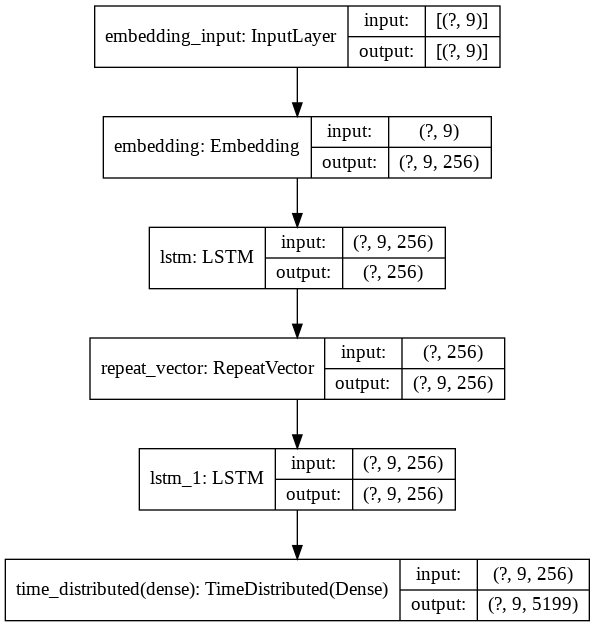

In [ ]:
def define_model(src_vocab, tar_vocab, src_timesteps, tar_timesteps, n_units):
	model = Sequential()
	model.add(Embedding(src_vocab, n_units, input_length=src_timesteps, mask_zero=True))
	model.add(LSTM(n_units))
	model.add(RepeatVector(tar_timesteps))
	model.add(LSTM(n_units, return_sequences=True))
	model.add(TimeDistributed(Dense(tar_vocab, activation='softmax')))
	return model
 
# define model
model = define_model(tel_vocab_size, eng_vocab_size, tel_length, eng_length, 256)
model.compile(optimizer='adam', loss='categorical_crossentropy')
# summarize defined model
print(model.summary())
plot_model(model, to_file='model.png', show_shapes=True)

In [ ]:
filename = 'model_final.h5'
checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
model.fit(trainX, trainY, epochs=20, batch_size=64, validation_data=(testX, testY), callbacks=[checkpoint], verbose=2)

Epoch 1/20

Epoch 00001: val_loss improved from inf to 4.48156, saving model to model_final.h5
141/141 - 50s - loss: 5.1958 - val_loss: 4.4816
Epoch 2/20

Epoch 00002: val_loss improved from 4.48156 to 4.26111, saving model to model_final.h5
141/141 - 48s - loss: 4.3479 - val_loss: 4.2611
Epoch 3/20

Epoch 00003: val_loss improved from 4.26111 to 4.17446, saving model to model_final.h5
141/141 - 47s - loss: 4.1644 - val_loss: 4.1745
Epoch 4/20

Epoch 00004: val_loss improved from 4.17446 to 4.11659, saving model to model_final.h5
141/141 - 47s - loss: 4.0550 - val_loss: 4.1166
Epoch 5/20

Epoch 00005: val_loss improved from 4.11659 to 4.11084, saving model to model_final.h5
141/141 - 48s - loss: 3.9700 - val_loss: 4.1108
Epoch 6/20

Epoch 00006: val_loss improved from 4.11084 to 4.07889, saving model to model_final.h5
141/141 - 46s - loss: 3.9057 - val_loss: 4.0789
Epoch 7/20

Epoch 00007: val_loss improved from 4.07889 to 4.07701, saving model to model_final.h5
141/141 - 46s - loss: 3

In [ ]:
from google.colab import files
files.download('model_final.h5') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.upload()

Saving english-telugu-both.pkl to english-telugu-both (1).pkl
Saving english-telugu-test.pkl to english-telugu-test (1).pkl
Saving english-telugu-train.pkl to english-telugu-train (1).pkl
Saving model_final.h5 to model_final (1).h5
